# 1º Trabalho de avaliação de visão computacional

Dados:
- Nome: Guilherme Guy de Andrade
- Matrícula: 22/0004641

## Requisitos
- pip
- ipykernel *(para a execução do notebook)*

## Execução:
Execute as células do Jupyter Notebook

Instalar dependências e importar pacotes:

In [308]:
# Instalar dependências
# Ocultar a saída
! pip install pipenv
! pipenv install

# Importar pacotes

import numpy as np
import scipy
from PIL import Image
from glob import glob
import matplotlib as mpl
import matplotlib.pyplot as plt
import skimage
from numba import jit, njit, prange


15330.38s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


15336.80s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


Installing dependencies from Pipfile.lock (ed21b6)...
To activate this project's virtualenv, run pipenv shell.
Alternatively, run a command inside the virtualenv with pipenv run.


Funções auxiliares:

In [309]:
# Funções gerais

def show_image(image: np.ndarray):
    # show grayscale image as actually a grayscale image
    plt.imshow(image, cmap='gray', vmin=0, vmax=255)

def show_images(images: np.ndarray):
    for image in images:
        show_image(image)
        plt.show()

def show_images_side_by_side(*images: np.ndarray, graph_titles: list[str] = []):

    # auto generate graph titles if none are provided
    if len(graph_titles) == 0:
        graph_titles = [f"Image {i}" for i in range(0, len(images))]

    if len(graph_titles) != len(images):
        raise ValueError('graph_titles must have the same length as images')

    # show images side by side
    _, axs = plt.subplots(1, len(images), figsize=(20, 20))

    for i in range(0, len(images)):
        axs[i].imshow(images[i], cmap='gray', vmin=0, vmax=255)
        axs[i].set_title(graph_titles[i])

    plt.show()

def show_multiple_intensity_graphs(*images: np.ndarray, graph_titles: list[str] = []):
    # show intensity histograms on different figures, stacked

    # auto generate graph titles if none are provided
    if len(graph_titles) == 0:
        graph_titles = [f"Intensity Histogram {i}" for i in range(0, len(images))]

    if len(graph_titles) != len(images):
        raise ValueError('graph_titles must have the same length as images')

    for i, image in enumerate(images):
        show_intensity_graph(image, graph_titles[i])

def show_intensity_graph(image: np.ndarray, graph_title: str = "Intensity Histogram"):
    display_height = image.shape[0] // 2

    plt.figure(figsize=(10, 2))

    # plot instensity value along a line
    plt.bar(
        range(0, image.shape[1]),
        image[display_height, :]
    )

    # value is not 255 to show a bit of blank space on top
    # of the graph
    plt.ylim((0, 255 + 20))

    plt.title(graph_title)

    plt.xlabel('Pixel')
    plt.ylabel('Intensity Value')
    plt.show()

def show_intensity_graph_side_by_side(images: list[np.ndarray], graph_titles):
    _, axs = plt.subplots(1, len(images), figsize=(20, 5))

    for i in range(0, len(images)):
        axs[i].bar(
            range(0, images[i].shape[1]),
            images[i][images[i].shape[0] // 2, :]
        )

        axs[i].set_ylim(0, 255 + 20)

        axs[i].set_title(graph_titles[i])

    plt.show()

# plot intensity graph and std_deviation line graph

def plot_intensity_graph_with_std_deviation(image: np.ndarray, std_deviation: np.ndarray):
    display_height = image.shape[0] // 2

    # plot instensity value along a line
    fig, ax = plt.subplots()
    ax.plot(image[display_height, :], color='green')

    # get transparent red color
    red = (1, 0, 0, 0.3)
    ax.plot(image[display_height, :] + std_deviation[display_height, :], color=red)
    ax.plot(image[display_height, :] - std_deviation[display_height, :], color=red)

    # value is not 255 to show a bit of blank space on top
    # of the graph
    plt.ylim((0, 255 + 20))

    # set size of graph
    fig.set_figheight(4)
    fig.set_figwidth(15)

    # add labels
    plt.title("Intensity Graph with Standard Deviation")
    plt.xlabel('Pixel')

    plt.show(fig)


def plot_all_intensity_graph_with_std_deviation(images: np.ndarray, std_deviation: np.ndarray, avg_img: np.ndarray):
    display_height = images.shape[1] // 2

    # plot instensity value along a line
    fig, ax = plt.subplots()
    blue = (0, 0, 1, 0.1)
    for i in range(0, len(images)):
        ax.plot(images[i][display_height, :], color=blue)

    ax.plot(avg_img[display_height, :], color='green')

    # get transparent red color
    red = (1, 0, 0, 0.5)
    ax.plot(avg_img[display_height, :] + std_deviation[display_height, :], color=red)
    ax.plot(avg_img[display_height, :] - std_deviation[display_height, :], color=red)

    # value is not 255 to show a bit of blank space on top
    # of the graph
    plt.ylim((0, 255 + 20))

    # set size of graph
    fig.set_figheight(4)
    fig.set_figwidth(15)

    # add labels
    plt.title("Intensity Graph with Standard Deviation")
    plt.xlabel('Pixel')

    plt.show(fig)


def load_images(pattern: str):
    files = sorted(glob(pattern))
    images = []
    for f in files:
        image = Image.open(f)
        image = image.convert('L')
        images.append(np.array(image))
    images = np.array(images)

    return images


# Questão 1.a

*Estime o ruído de seu sistema de aquisição de imagens (pode ser uma webcamera ou qualquer outra) usando os passos propostos no algoritmo EST_NOISE e AUTO_COVARIANCE, expostos nos slides em sala de aula. Você precisará capturar diversas imagens da mesma cena estática, em um ambiente sem variações de iluminação (lâmpadas fluorescentes afetam a iluminação das imagens), plotando depois o gráfico da intensidade da imagem ao longo de uma linha e a variação produzida pelo ruído. Esta variação deverá ser pequena, da ordem de menos de 5% em geral, dependendo da qualidade da câmera.*

Imagens a serem analisadas:

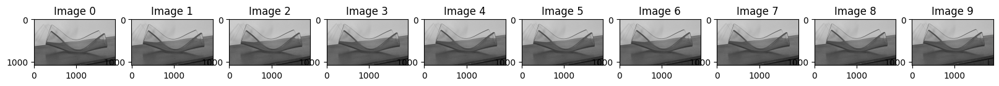

In [310]:
# LOAD IMAGES AS HSV
IMAGES_1A = load_images('trab1/imgs/a/*.jpg')
show_images_side_by_side(*IMAGES_1A)


In [311]:
@njit
def average_image(images: np.ndarray):

    avg_img = np.zeros(images.shape[1:])
    for i in range (0, images.shape[0]):
        avg_img += images[i]

    avg_img /= images.shape[0]

    return avg_img

@njit
def std_deviation_image(images: np.ndarray, avg_im: np.ndarray = None):

    if avg_im is None:
        avg_im = average_image(images)

    n_samples = images.shape[0]
    std_im = np.zeros(images.shape[1:])
    for i in range(0, n_samples):
        std_im += (images[i] - avg_im)**2

    std_im /= n_samples
    std_im = np.sqrt(std_im)

    return std_im


@njit
def est_noise(images: np.ndarray):

    # Imagem = Imagem_pura + ruido
    # O ruído pode ser quantificado como: SNR = media_sinal/desvio_padrao_ruido
    average = average_image(images)
    std_dev = std_deviation_image(images, average)

    SNR = np.where(std_dev == 0, 0, average / std_dev)

    return SNR

@njit
def auto_covariance(images: np.ndarray, avg_im: np.ndarray = None):

        if avg_im is None:
            avg_im = average_image(images)

        n_samples = images.shape[0]
        auto_cov = np.zeros(images.shape[1:])
        for i in range(0, n_samples):
            auto_cov += (images[i] - avg_im)**2

        auto_cov /= n_samples

        return auto_cov

Faz o cálculo e exibe os resultados:

In [312]:

avg_im = average_image(IMAGES_1A)
std_dev_im = std_deviation_image(IMAGES_1A, avg_im)
snr = est_noise(IMAGES_1A)
auto_cov = auto_covariance(IMAGES_1A, avg_im)

As seguintes imagens representam o cálculo destes valores no conjunto de imagens analisadas. E os gráficos mostram o valor de intensidade ao longo de uma linha da imagem.

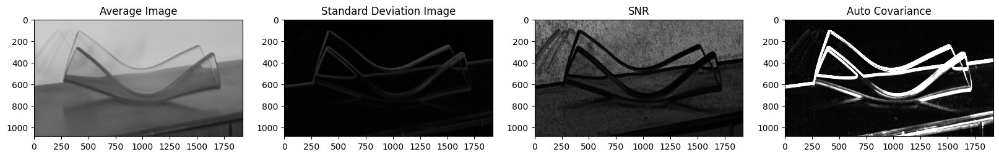

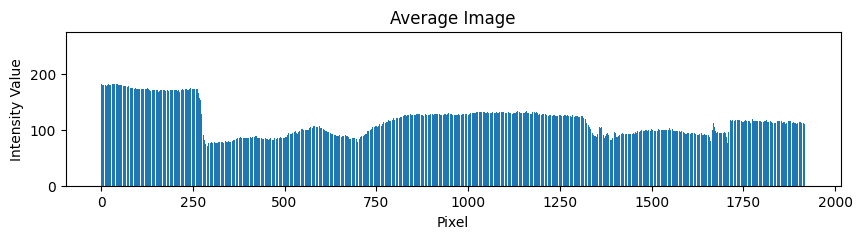

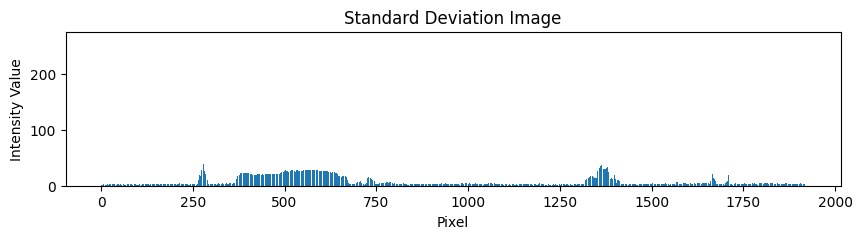

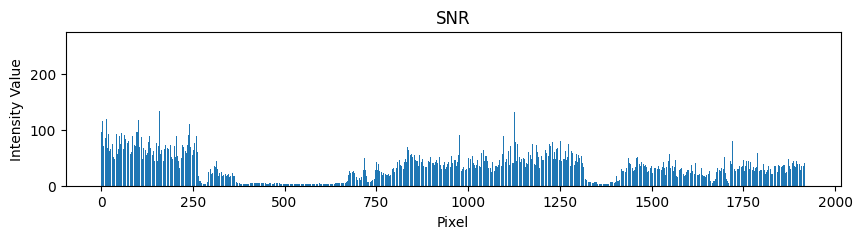

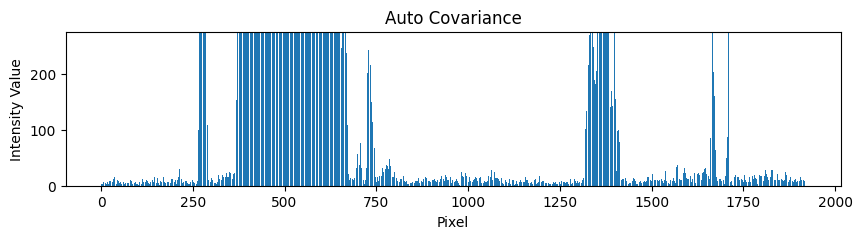

In [313]:
titles = ["Average Image", "Standard Deviation Image", "SNR", "Auto Covariance"]

show_images_side_by_side(avg_im, std_dev_im, snr, auto_cov, graph_titles=titles)
show_multiple_intensity_graphs(
    avg_im, std_dev_im, snr, auto_cov,
    graph_titles=titles
)

Podemos observar que em momentos em que o desvio padrão é maior, a variação da intensidade da imagem é maior, o que indica que o ruído é maior. O que é confirmado ao observar o SNR.

In [314]:

averages = {
    'SNR': np.mean(snr),
    'Average Image Intensity': np.mean(avg_im),
    'Standard Deviation Images': np.mean(std_dev_im),
    'Auto Covariance': np.mean(auto_cov)
}

print(f"Averages:")
for key, value in averages.items():
    print(f"* {key}: {value}")

Averages:
* SNR: 50.92969842698794
* Average Image Intensity: 132.05843354552476
* Standard Deviation Images: 5.963709570797012
* Auto Covariance: 113.96605972222221


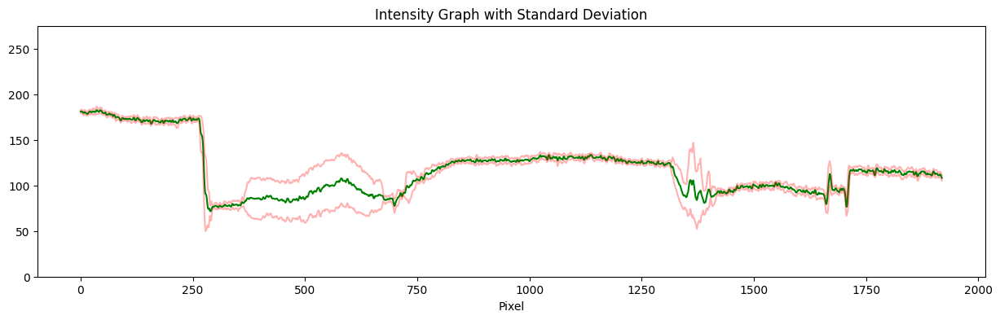

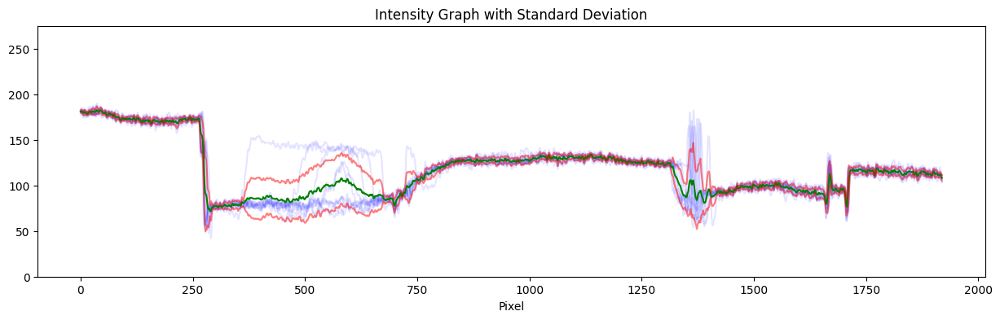

In [315]:
plot_intensity_graph_with_std_deviation(avg_im, std_dev_im)
plot_all_intensity_graph_with_std_deviation(IMAGES_1A, std_dev_im, avg_im)

Os gráficos acima mostram a intensidade ao longo de uma linha horizontal no meio da imagem, em verde a imagem média, em vermelho o desvio padrão em relaçãõ a média e em azul todo o conjunto de imagens.

# Questão 1.b

*Escreva rotinas para inserção de ruído gaussiano e do tipo sal-e-pimenta e, após,
implemente um filtro de ruídos Gaussiano e Mediano e aplique sobre as imagens, mostrando
o resultado da aplicação dos dois filtros sobre as duas imagens. O código deve permitir a
especificação da largura do filtro, para percepção dos resultados. Mostre as imagens e discuta
os resultados.*

Carrega as imagens:

/tmp/ipykernel_934557/2573833541.py:146: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  images = np.array(images)


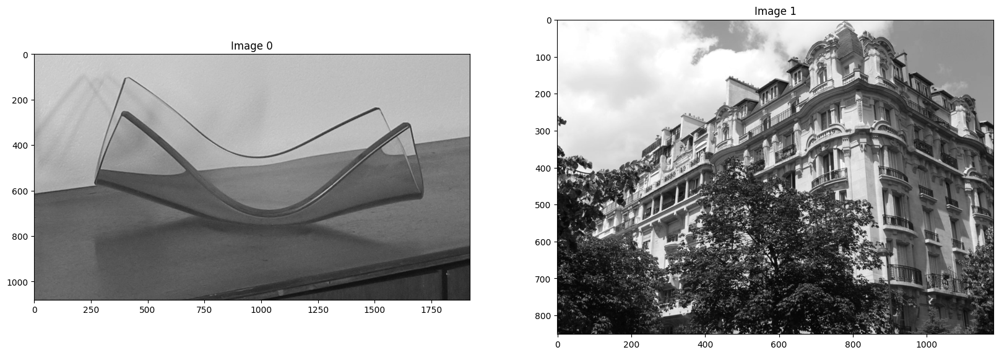

In [316]:
# Carrega imagem
IMAGES_1B = load_images('trab1/imgs/b/*.jpg')
show_images_side_by_side(*IMAGES_1B)

Código dos filtros e geradores de ruído:

In [317]:
def gaussian_noise(image: np.ndarray, mean: float = 0, std: float = 1):
    noise = np.random.normal(mean, std, image.shape)
    return image + noise

def salt_pepper_noise(image: np.ndarray, epsilon: float = 0.90, intensity_min: int = 0, intensity_max: int = 255):

    random_x = np.random.random(image.shape)
    random_y = np.random.random(image.shape)

    intensity_delta = intensity_max - intensity_min

    noise = np.where(
        random_x >= epsilon, intensity_min + random_y * intensity_delta,
        0
    )

    return image + noise

def linear_filter(image: np.ndarray, kernel: np.ndarray):

    # scipy automatically chooses fft or direct convolution
    # based on the size of inputs to use the most efficient

    return scipy.signal.convolve(image, kernel, mode='same')

def avg_filter(image: np.ndarray, kernel_size: int = 3):

    kernel = np.ones((kernel_size, kernel_size)) / (kernel_size ** 2)

    return linear_filter(image, kernel)

def gaussian_kernel(kernel_size: int = 50, sigma: int = 5):

    kernel = np.outer(
        scipy.signal.windows.gaussian(kernel_size, sigma),
        scipy.signal.windows.gaussian(kernel_size, sigma),
    )

    kernel /= 2 * np.pi * sigma ** 2

    return kernel

def gaussian_filter(image: np.ndarray, kernel_size: int = 50, sigma: int = 5):
    return linear_filter(
        image,
        gaussian_kernel(kernel_size, sigma)
    )

@njit(parallel=True)
def median_filter(image: np.ndarray, kernel_size: int = 10):

    image_filtered = np.zeros(image.shape)

    kernel_size = kernel_size // 2

    for i in prange(0, image.shape[0]):
        for j in prange(0, image.shape[1]):

            begin_i = max(0, i - kernel_size)
            end_i = min(i + kernel_size, image.shape[0])
            begin_j = max(0, j - kernel_size)
            end_j = min(j + kernel_size, image.shape[1])

            region = image[begin_i:end_i, begin_j:end_j]

            image_filtered[i, j] = np.median(region)

    return image_filtered


# Função auxiliar para plotar gráficos e exibir resultados
def apply_filter_show_graphs(filter_func, filter_name: str, *args, **kwargs):
    for idx, image in enumerate(IMAGES_1B):
        filtered_imgs = [
            filter_func(image, *args, **kwargs),
            filter_func(gaussian_imgs[idx], *args, **kwargs),
            filter_func(salt_pepper_imgs[idx], *args, **kwargs)
        ]

        show_images_side_by_side(
            image, gaussian_imgs[idx], salt_pepper_imgs[idx],
            graph_titles=["Original", "Gaussian Noise", "Salt & Pepper Noise"]
        )

        show_images_side_by_side(
            *filtered_imgs,
            graph_titles=[f"Original ({filter_name})", f"Gaussian Noise ({filter_name})", f"Salt & Pepper Noise ({filter_name})"]
        )

        show_intensity_graph_side_by_side(
            [image, gaussian_imgs[idx], salt_pepper_imgs[idx]],
            graph_titles=["Original", "Gaussian Noise", "Salt & Pepper Noise"]
        )

        show_intensity_graph_side_by_side(
            filtered_imgs,
            graph_titles=[f"Original ({filter_name})", f"Gaussian Noise ({filter_name})", f"Salt & Pepper Noise ({filter_name})"]
        )


## Ruídos

### Ruído gaussiano:

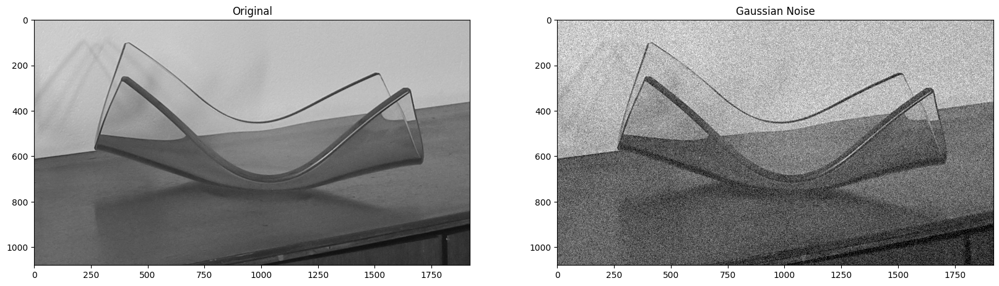

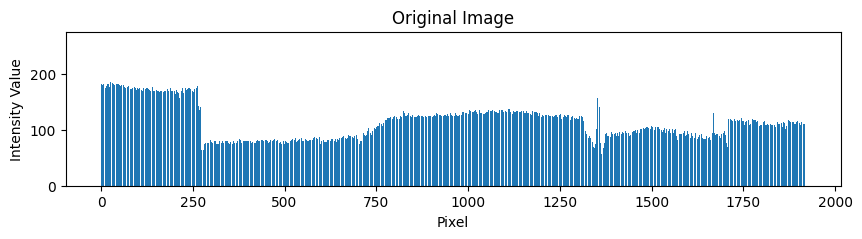

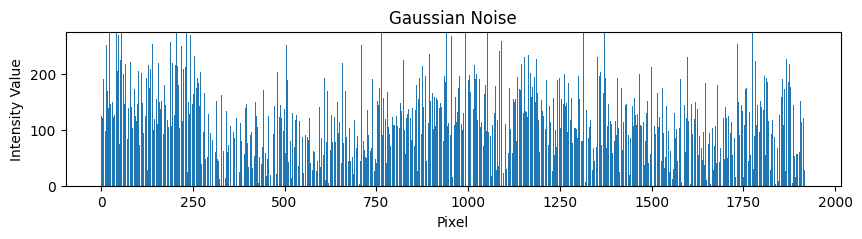

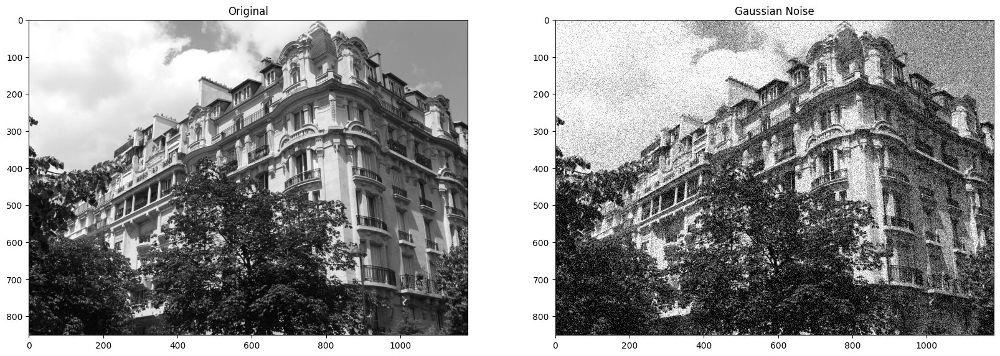

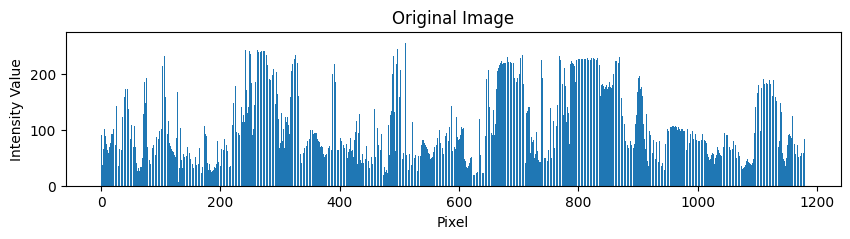

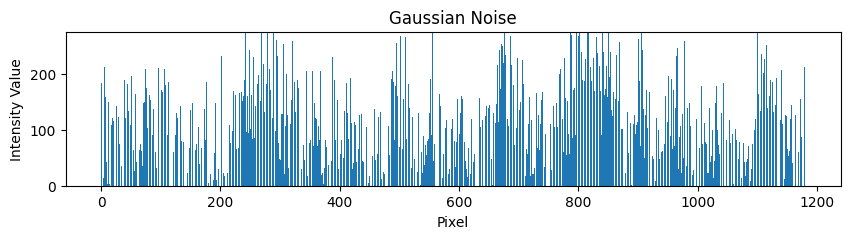

In [318]:
gaussian_imgs = []

for image in IMAGES_1B:
    gaussian_img = gaussian_noise(image, 0, 255//4)
    gaussian_imgs.append(gaussian_img)
    show_images_side_by_side(image, gaussian_img, graph_titles=["Original", "Gaussian Noise"])
    show_multiple_intensity_graphs(
        image, gaussian_img,
        graph_titles=["Original Image", "Gaussian Noise"])

### Ruído sal e pimenta:

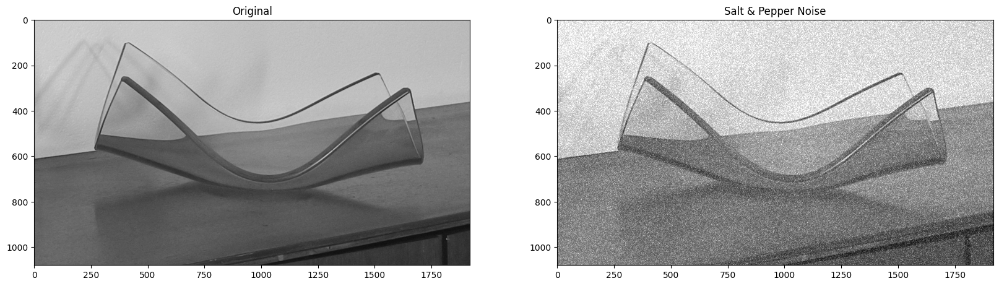

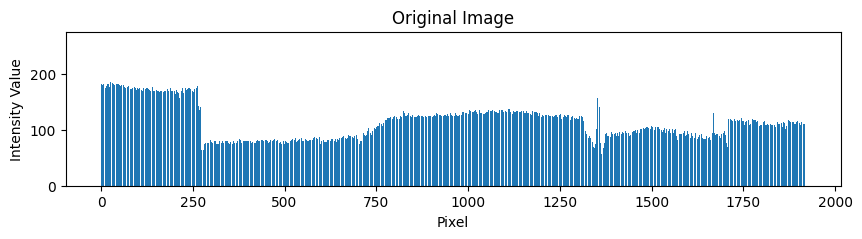

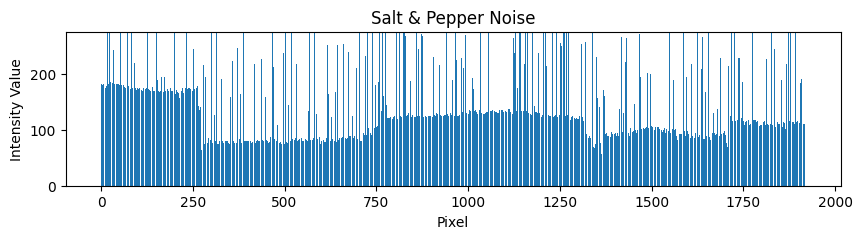

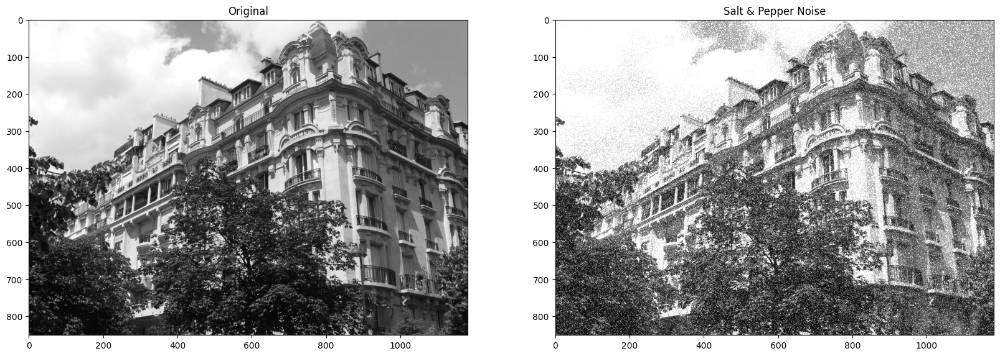

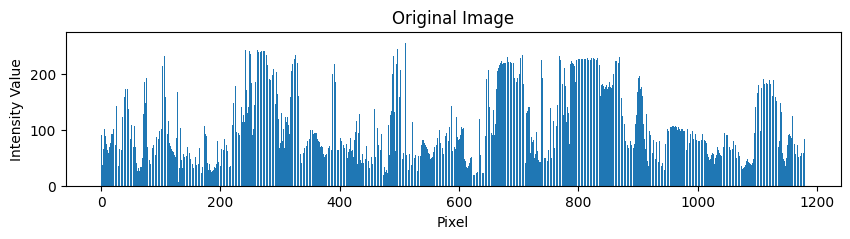

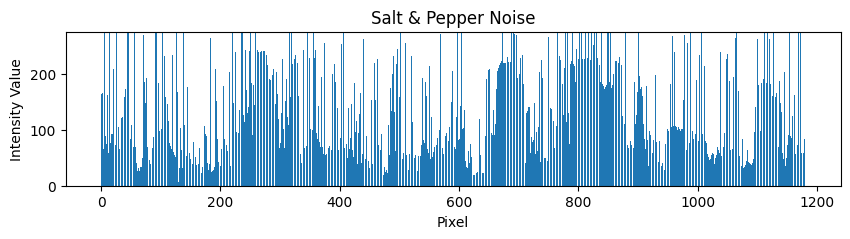

In [319]:
salt_pepper_imgs = []

for image in IMAGES_1B:
    salt_pepper_img = salt_pepper_noise(image, epsilon=0.75)
    salt_pepper_imgs.append(salt_pepper_img)
    show_images_side_by_side(image, salt_pepper_img, graph_titles=["Original", "Salt & Pepper Noise"])
    show_multiple_intensity_graphs(
        image, salt_pepper_img,
        graph_titles=["Original Image", "Salt & Pepper Noise"])


## Filtros

### Filtro Média
Não estava na questão, mas acabei fazendo para testar

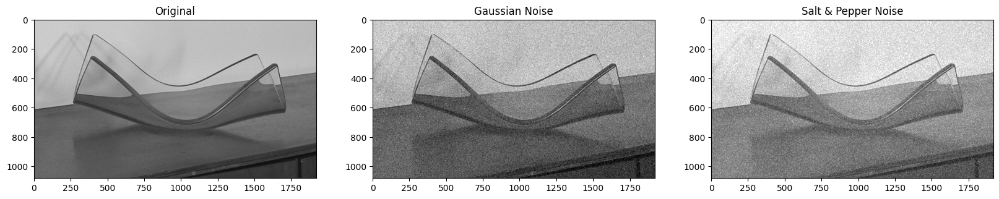

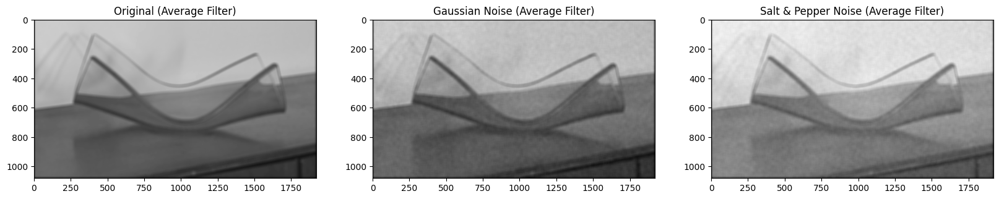

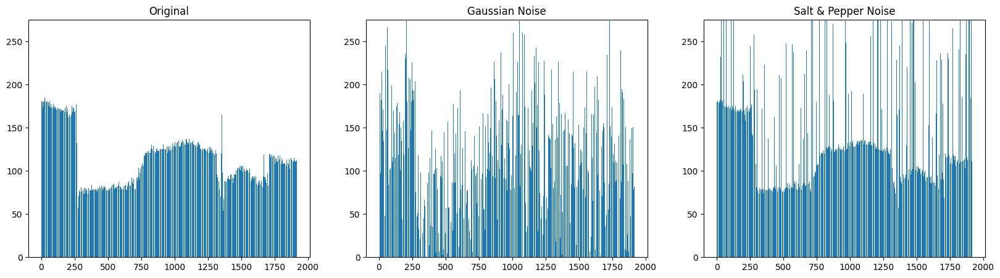

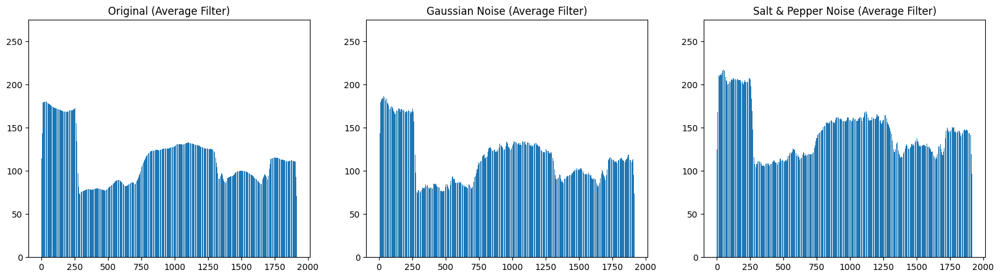

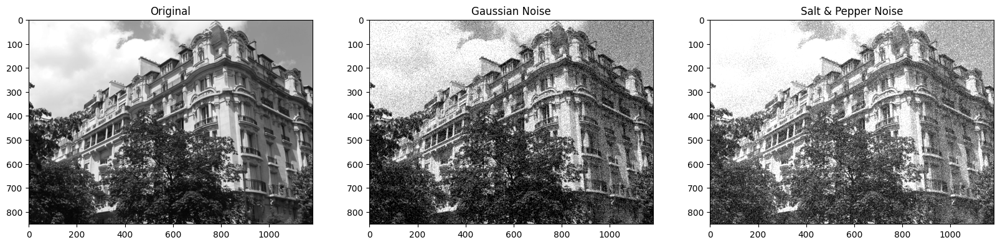

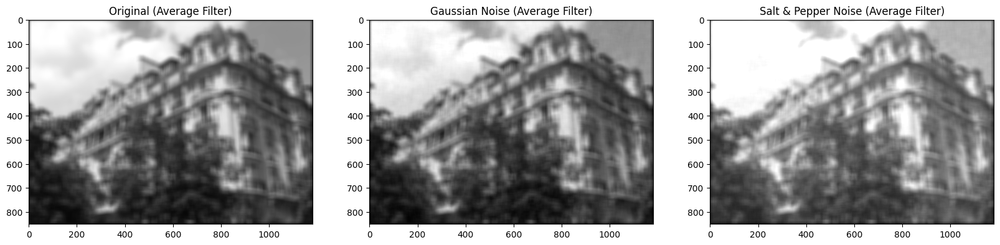

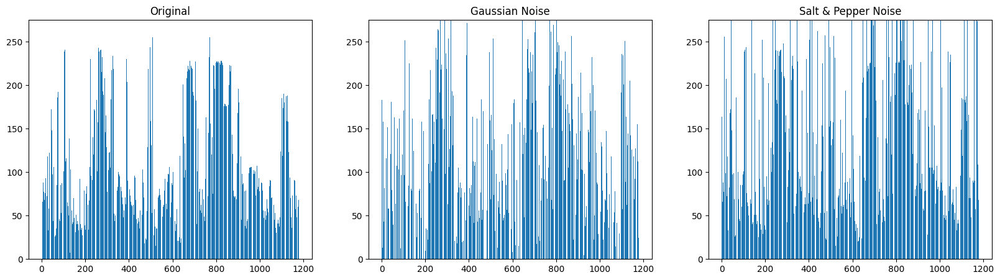

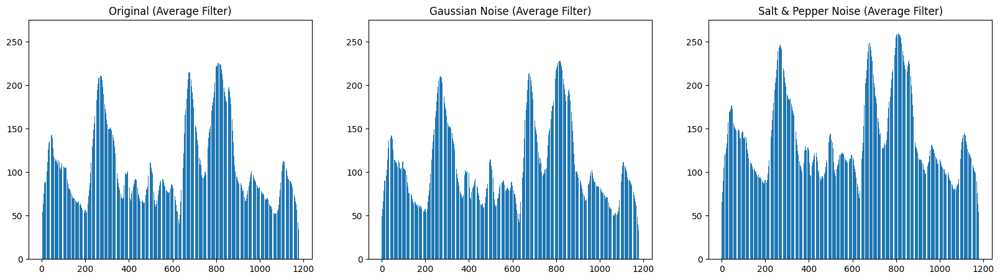

In [320]:
apply_filter_show_graphs(avg_filter, "Average Filter", kernel_size=25)

### Filtro Gaussiano

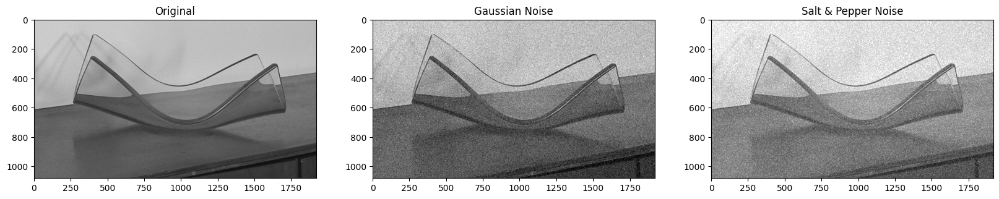

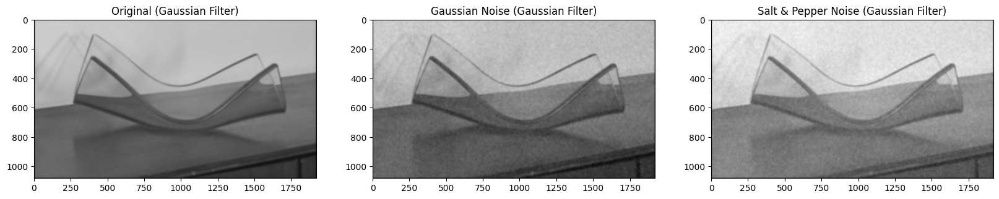

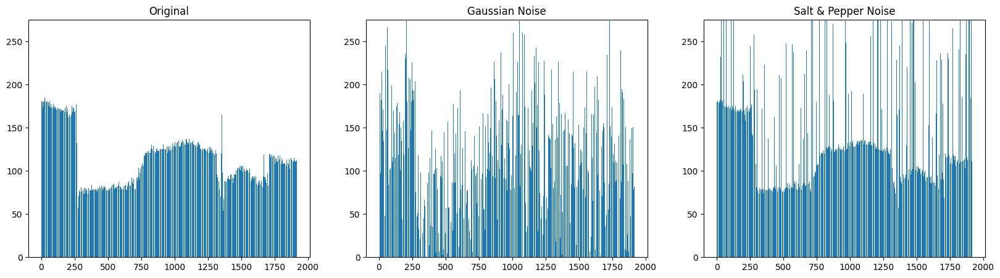

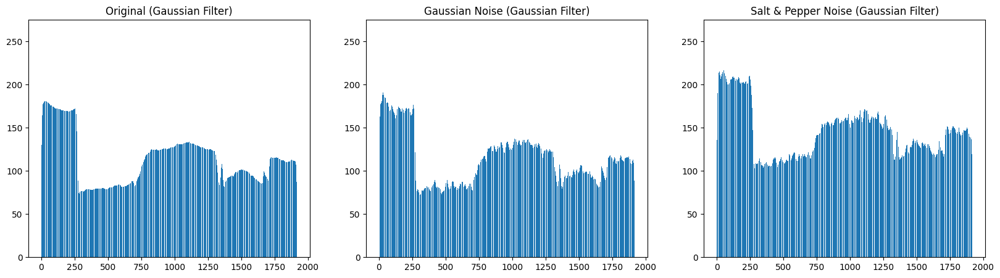

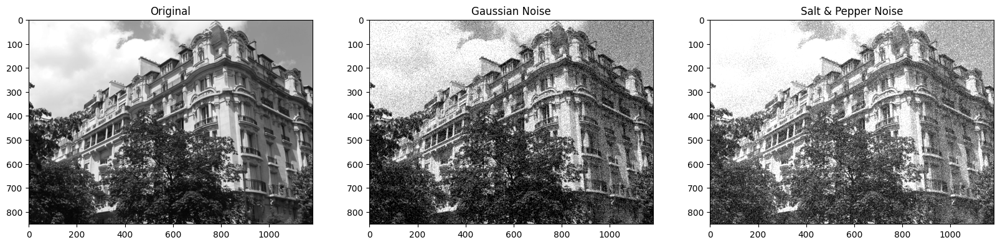

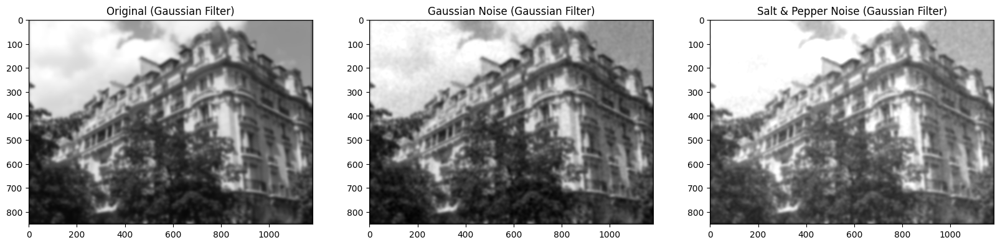

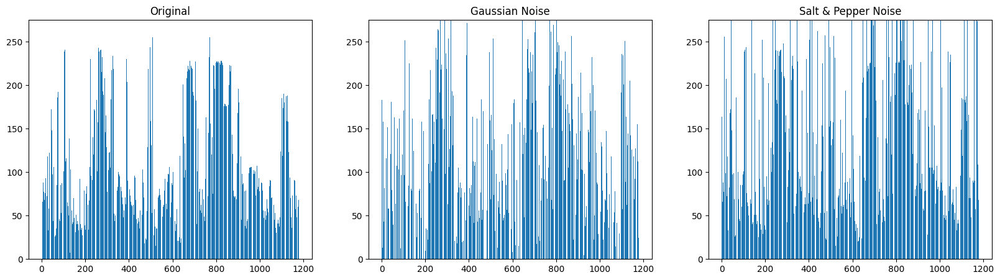

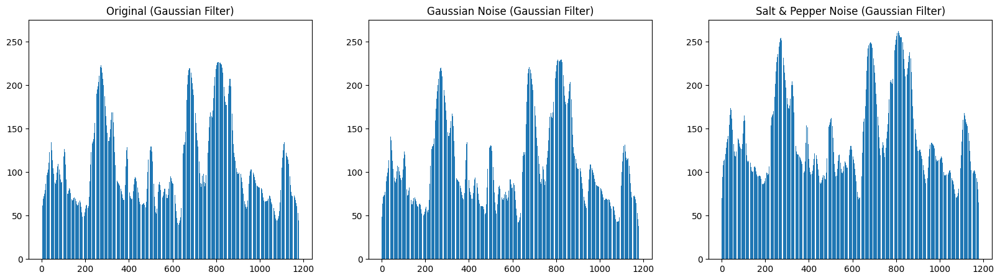

In [321]:
apply_filter_show_graphs(
    gaussian_filter,
    "Gaussian Filter",
    kernel_size=50,
    sigma=5
)

### Filtro Mediano

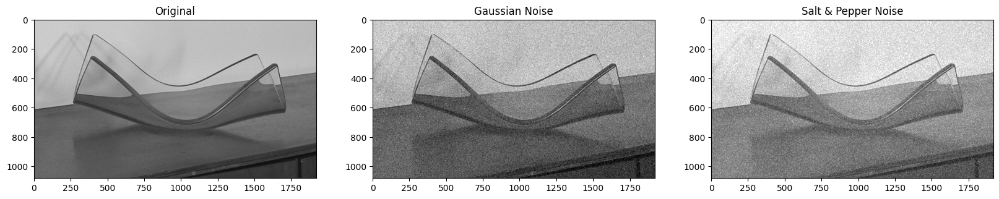

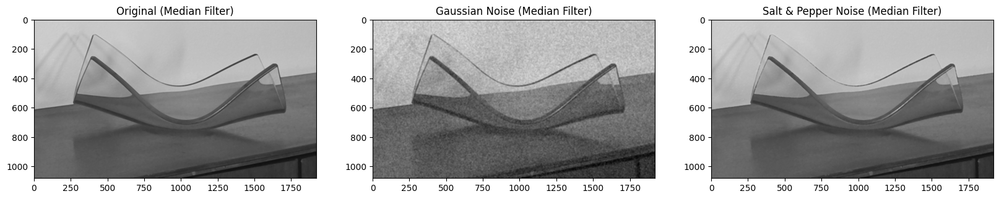

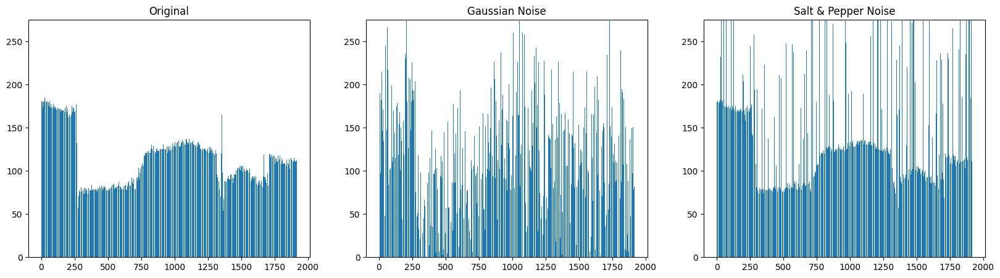

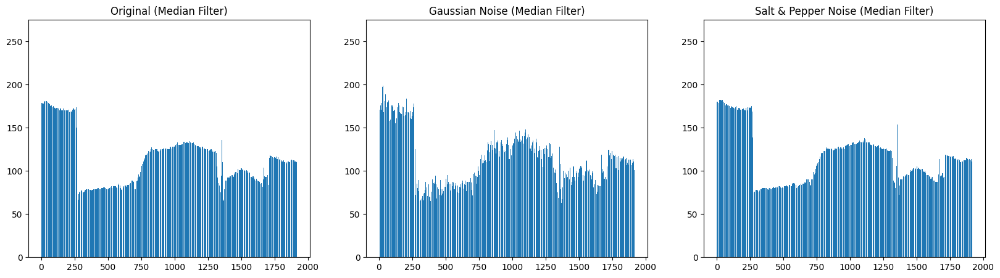

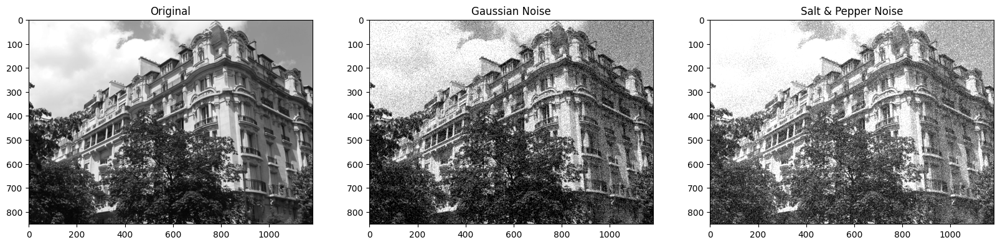

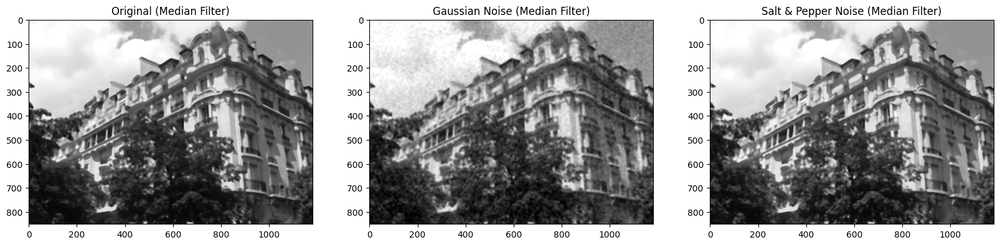

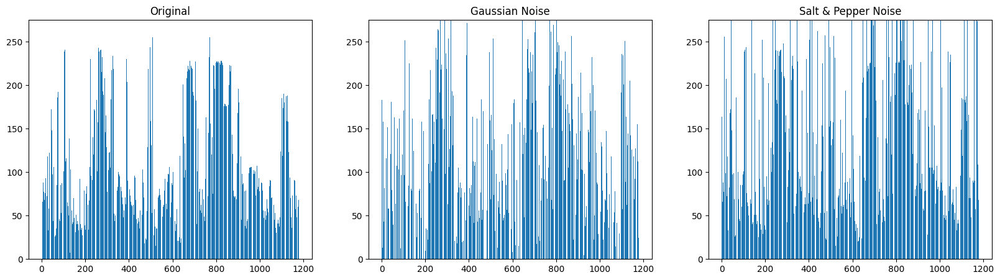

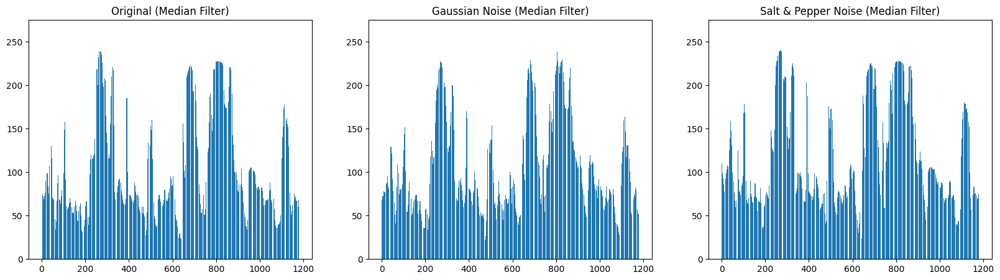

In [322]:
apply_filter_show_graphs(
    median_filter,
    "Median Filter",
    kernel_size=10
)

# Questão 1.c

*Use uma rotina qualquer para o algoritmo CANNY e produza diversas imagens indicando os efeitos de escala e os limiares de contraste nos contornos detectados. Implemente os detectores de Robert e Sobel nas mesmas imagens, para uma única escala, e compare os três algoritmos. Sugestão: Use a função icanny fornecida pela Machine Vison ToolBox, que pode ser baixada do site [www.petercorke.com](www.petercorke.com)*

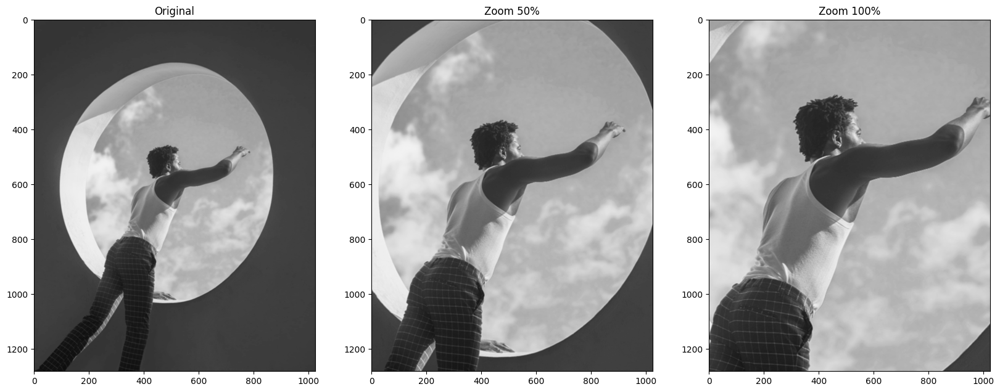

In [323]:
RAW_IMAGES_1C = load_images('trab1/imgs/c/*.jpg')
# img source: https://www.pexels.com/pt-br/foto/solitario-no-topo-13747843/
IM_1C_NAMES = ["Original", "Zoom 50%", "Zoom 100%"]

# apply gaussian filter to all images
IMAGES_1C = [scipy.ndimage.gaussian_filter(img, sigma=1) for img in RAW_IMAGES_1C]

show_images_side_by_side(*IMAGES_1C, graph_titles=IM_1C_NAMES)


In [324]:
def canny_edge_detection(
   image: np.ndarray,
   sigma=1,
   low_threshold=None,
   high_threshold=None
):

   canny_image = skimage.feature.canny(
      image,
      sigma=sigma,
      low_threshold=low_threshold,
      high_threshold=high_threshold)

   return canny_image * 255 # multiply by 255 to make it from 0,1 to 0,255


### Imagens com diferentes sigmas para Canny Edge Detector

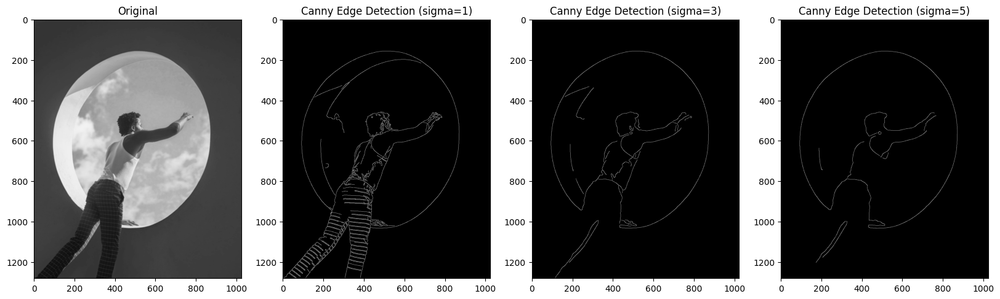

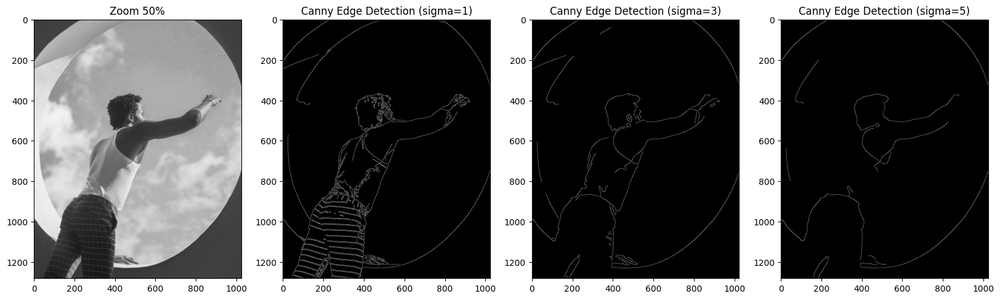

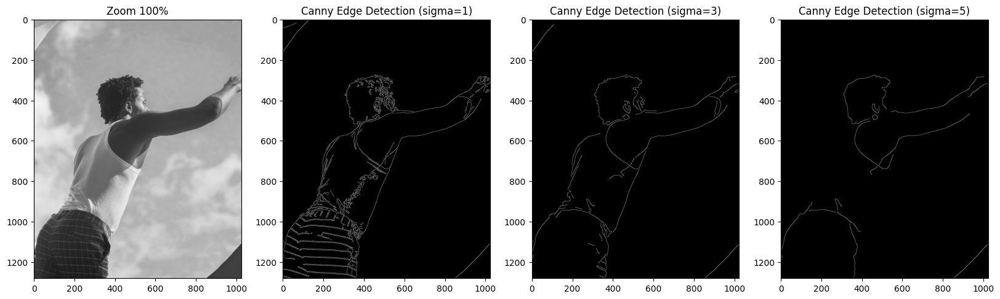

In [325]:
for idx, image in enumerate(IMAGES_1C):

    filtered_imgs = [
        image,
        canny_edge_detection(image, sigma=1),
        canny_edge_detection(image, sigma=3),
        canny_edge_detection(image, sigma=5),
    ]

    titles = [
        IM_1C_NAMES[idx],
        "Canny Edge Detection (sigma=1)",
        "Canny Edge Detection (sigma=3)",
        "Canny Edge Detection (sigma=5)",
    ]

    show_images_side_by_side(*filtered_imgs, graph_titles=titles)

### Imagens com diferentes limiares para Canny Edge Detector

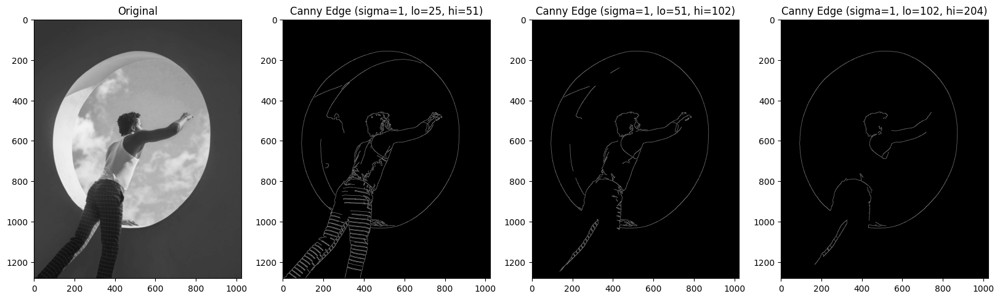

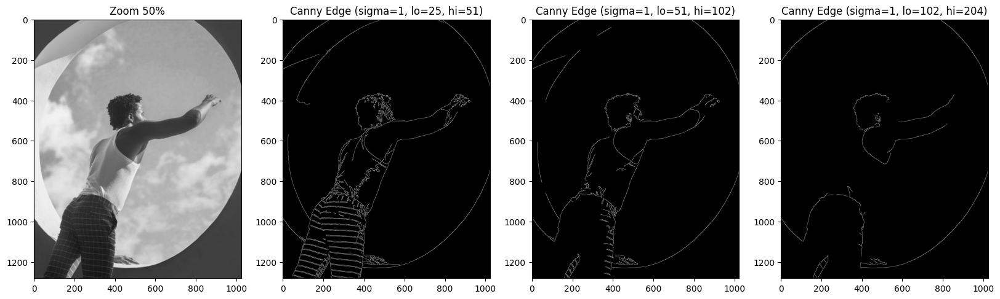

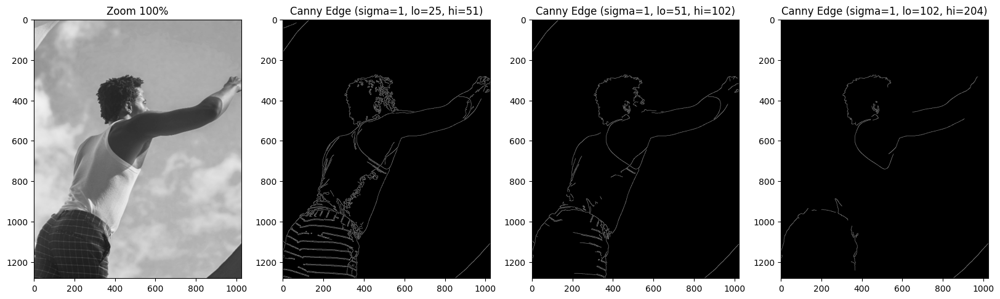

In [326]:
for idx, image in enumerate(IMAGES_1C):

    filtered_imgs = [
        image,
        canny_edge_detection(image, sigma=1, low_threshold=25, high_threshold=51),
        canny_edge_detection(image, sigma=1, low_threshold=51, high_threshold=102),
        canny_edge_detection(image, sigma=1, low_threshold=102, high_threshold=204),
    ]

    titles = [
        IM_1C_NAMES[idx],
        "Canny Edge (sigma=1, lo=25, hi=51)",
        "Canny Edge (sigma=1, lo=51, hi=102)",
        "Canny Edge (sigma=1, lo=102, hi=204)",
    ]

    show_images_side_by_side(*filtered_imgs, graph_titles=titles)

## Canny vs Robert vs Sobel

In [343]:
def sobel_edge_detection(image: np.ndarray, threshold=20):

   # apply gaussian filter
   image = gaussian_filter(image, kernel_size=5, sigma=1)

   kernel_1 = np.array([
      [-1, 0, 1],
      [-2, 0, 2],
      [-1, 0, 1]
   ])

   kernel_2 = np.array([
      [-1, -2, -1],
      [0,   0,  0],
      [1,   2,  1]
   ])

   im_1 = linear_filter(image, kernel_1)
   im_2 = linear_filter(image, kernel_2)

   gradient = np.sqrt(im_1**2 + im_2**2)

   return np.where(gradient > threshold, 255, 0)


   #sobel_image = skimage.filters.sobel(image)
   #return sobel_image * 255 # multiply by 255 to make it from 0,1 to 0,255

def roberts_edge_detection(image: np.ndarray, threshold=2):

   # apply gaussian filter
   image = gaussian_filter(image, kernel_size=5, sigma=1)

   kernel_1 = np.array([
      [1, -1],
      [-1, 1],
   ])

   kernel_2 = np.array([
      [-1, 1],
      [1, -1],
   ])

   im_1 = linear_filter(image, kernel_1)
   im_2 = linear_filter(image, kernel_2)

   gradient = np.sqrt(im_1**2 + im_2**2)

   return np.where(gradient > threshold, 255, 0)

   #roberts_image = skimage.filters.roberts(image)
   #return roberts_image * 255 # multiply by 255 to make it from 0,1 to 0,255


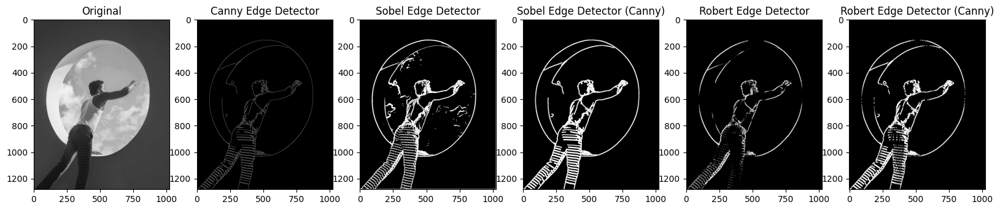

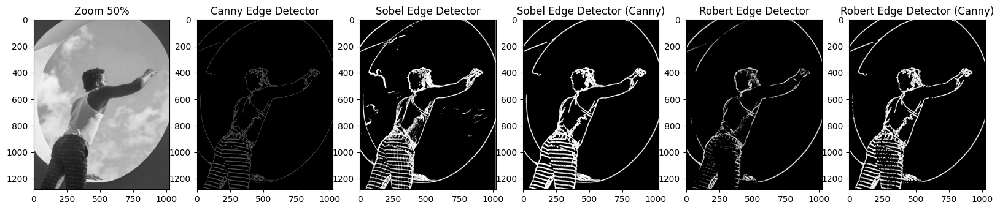

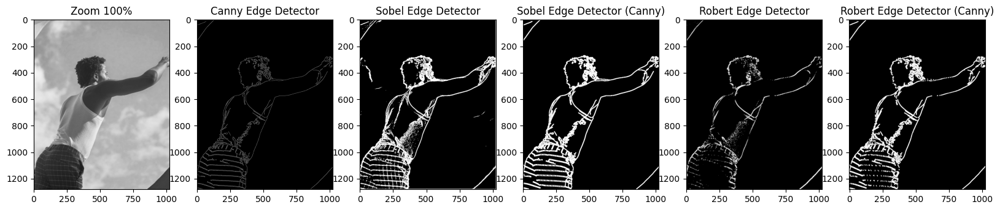

In [346]:
for idx, image in enumerate(IMAGES_1C):

    canny_img = canny_edge_detection(image)

    filtered_imgs = [
        image,
        canny_img,
        sobel_edge_detection(image),
        sobel_edge_detection(canny_img),
        roberts_edge_detection(image),
        roberts_edge_detection(canny_img),
    ]

    titles = [
        IM_1C_NAMES[idx],
        "Canny Edge Detector",
        "Sobel Edge Detector",
        "Sobel Edge Detector (Canny)",
        "Robert Edge Detector",
        "Robert Edge Detector (Canny)",
    ]

    show_images_side_by_side(*filtered_imgs, graph_titles=titles)